# Palm Crown Detection - YoloV5 Training

This notebook is used to train a YoloV5 image detection model to detect the top or 'crown' of oil palm trees. 

The YoloV5 models and documentation can be found in the official YoloV5 github repository: 
https://github.com/ultralytics/yolov5 

## Setup


First, we start by cloning the YoloV5 repo and installing the necessary dependencies. 

If you are running this on a cloud based instance (like google colab), please enable the GPU by changing the runtime type. 


In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
from yolov5 import utils

from IPython import display
from IPython.utils import io
from IPython.display import clear_output
from pathlib import Path
import yaml
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline
display = utils.notebook_init()  # checks

INFO:yolov5:YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 22.9/78.2 GB disk)


## Labelling Images

YOLOv5 accepts annotations / labels in the following format:

```class x_center y_center width height```

- We can use Roboflow (https://roboflow.com/) to label the images, or manually label the images using LabelImg. 
- Labels should be saved as a txt file, one file per image. 





## Uploading Data

#### If using google colab
There are 2 ways of getting data into google colab. 
- Manually upload data (Not recommended). You can manually upload data using the left panel of google colab. However, all data will be automatically deleted once you stop the colab instance. 
- Upload the data to google drive, then mount google drive. (Recommended)

**Files in the Colab environment are automatically deleted once you stop the colab instance. Remember to save or download your files before you close colab.**

Useful tip: You can drag and drop to move folders from google drive to the colab environment and vice versa. 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Dataset Directory

After mounting your drive, there should now be 2 folders in your main directory: `/yolov5` and `/drive`

Create a new folder called `/datasets` so that the main directory now has 3 folders. 

Files should be structured in 2 folders:
- an image directory containing the actual images
- a labels directory contaning the txt files of labels

Images and labels should also be split into training, testing and validation sets. 

The final dataset directory should look like this:
```
/yolov5
/drive
/datasets
--/palmcrowndetection
----/images
------/train
------/test
------/validation
----/labels
------/train
------/test
------/validation

```


In [ ]:
Path(f"../datasets").mkdir(parents=True, exist_ok=True)

## Defining YAML file

Inside the `/yolov5/data/` directory, upload the `palm_data.yaml` file. (Found in the the same Github repo)

This file is used to specify the location of the YOLO v5 images folder, the YOLO v5 labels folder, and information on our custom classes.

## Data Preprocessing

Exploring the posibility of using Canny Edge detection to extract relevant features. 

Canny Edge detection makes the leaves of the palm tree more prominent against the green grass background, allowing easier detection. 

In [ ]:
import cv2
import numpy as np

from google.colab.patches import cv2_imshow

# function that accepts an image / frame as input and filters it with Canny edge detection algorithm
def canny_filter(image):
    (height, width) = (image.shape[0], image.shape[1])

    # we have to turn the image into grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # edge detection kernel (Canny's algorithm)
    canny_image = cv2.Canny(gray_image, 100, 120)


    return canny_image

In [ ]:
original_image = cv2.imread('../datasets/palmcrowndetection/images/train/DJI_0274.JPG')

processed_image = canny_filter(original_image)



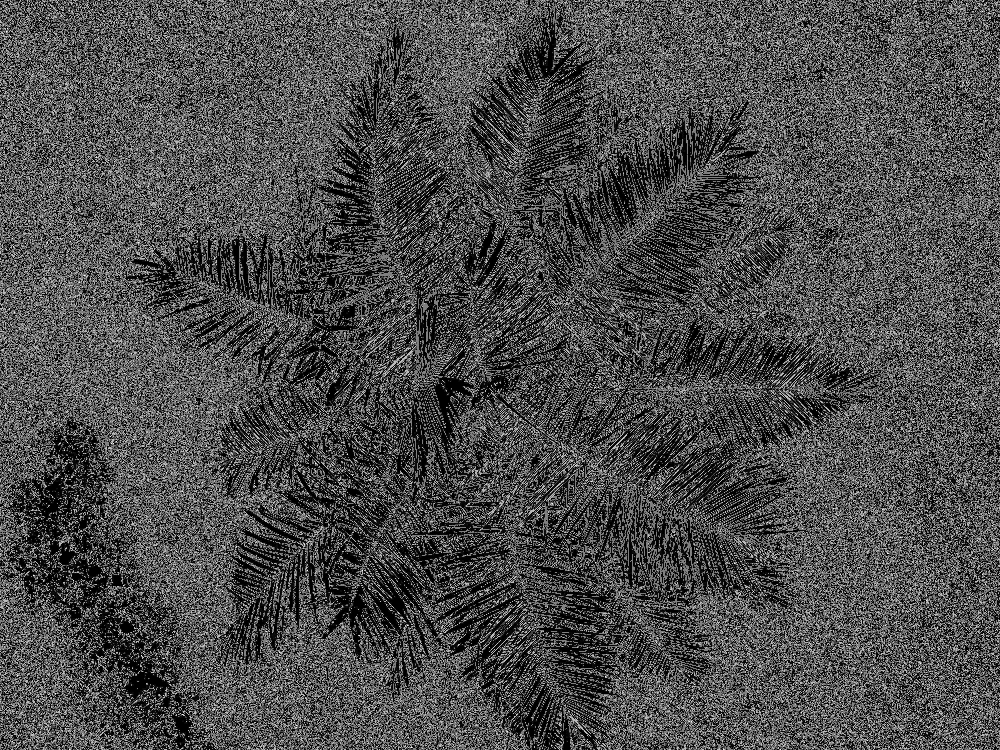

In [ ]:
cv2_imshow(processed_image)

## Training

We run `train.py` to train our custom YoloV5 model. 

YoloV5 models come in different sizes. 
- Larger models have more parameters and take longer to train, but have more accurate detections and have higher mAP scores. 
- Smaller models have less parameters and are quicker to train

Since my YoloV5 model is intended to be deployed on a mobile platform (UAV), processing power limits need to be taken into consideration. 

As such, I have chosen to train smaller sized models that are suitable for deployement on Nvidia Jetson boards. 

**Input Arguments**
- img: Size of the input training images in pixels
- data: The yaml file that points to our dataset directory and defines our custom class names
- weights: The YoloV5 model that we will be training on. We can adjust the model size by specifying different weights. 
- project: The name of the main project folder
- name: The name of the folder to save the model




#### Yolov5 Small Model

In [ ]:
!python train.py --img 640 --batch 32 --epochs 150 --data 'palm_data.yaml' --weights 'yolov5s6.pt' --cache --freeze 12 --project 'runs_palm' --name 'yolov5small'

train: weights=yolov5s6.pt, cfg=, data=palm_data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs_palm, name=yolov5small, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7,

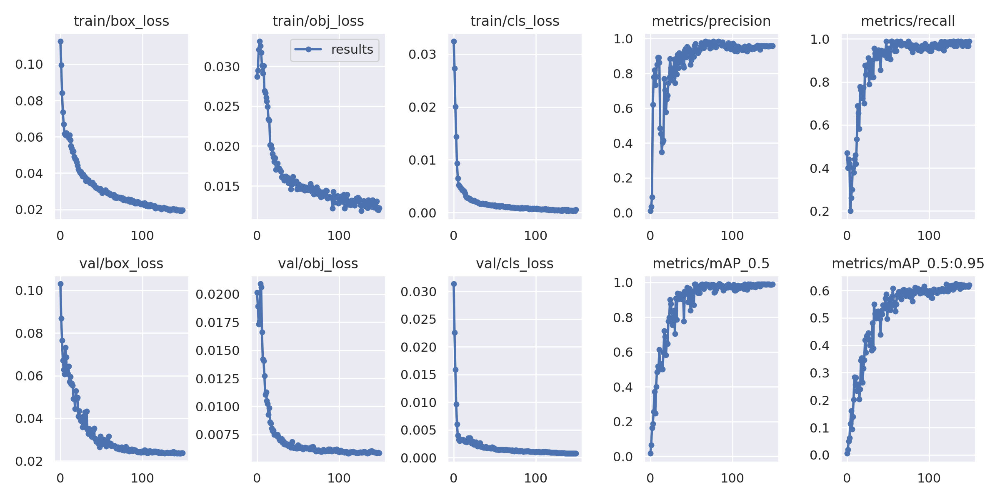

In [ ]:
display.Image(f"runs_palm/yolov5small/results.png")

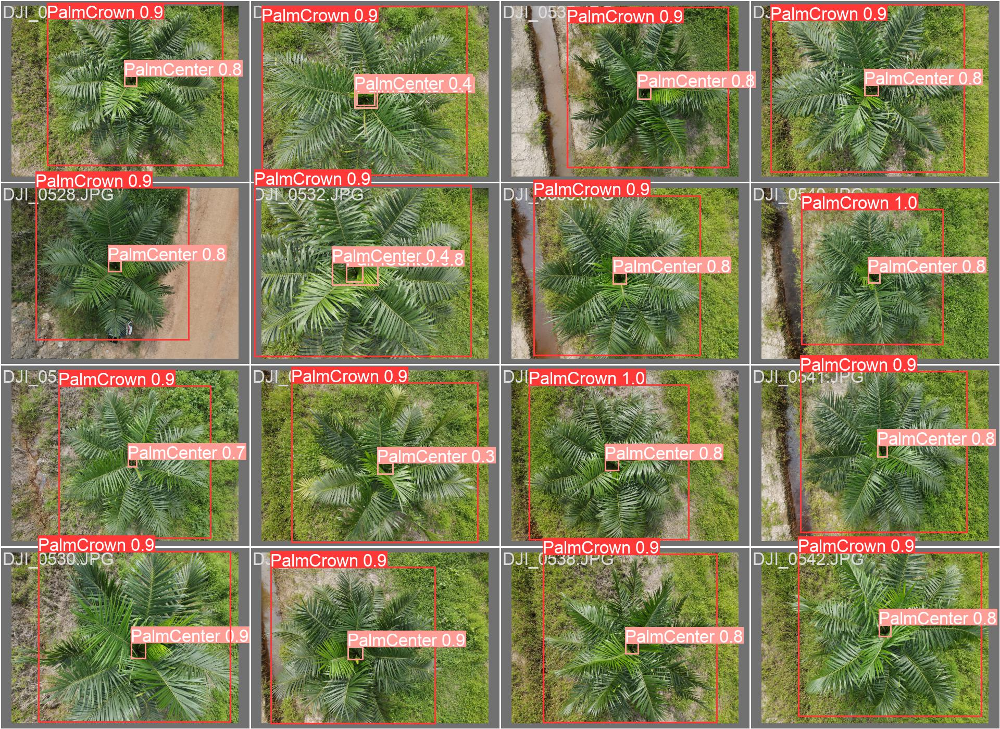

In [ ]:
# Show ver 1 predictions
display.Image(f"runs_palm/yolov5small/val_batch0_pred.jpg")

#### Yolov5 Nano Model

In [ ]:
#Limit output cell height
from google.colab.output import eval_js
eval_js('google.colab.output.setIframeHeight("100")')

!python train.py --img 640 --batch 32 --epochs 150 --data 'palm_data.yaml' --weights 'yolov5n6.pt' --cache --freeze 12 --project 'runs_palm' --name 'yolov5nano'

train: weights=yolov5n6.pt, cfg=, data=palm_data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs_palm, name=yolov5nano, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[12], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, 

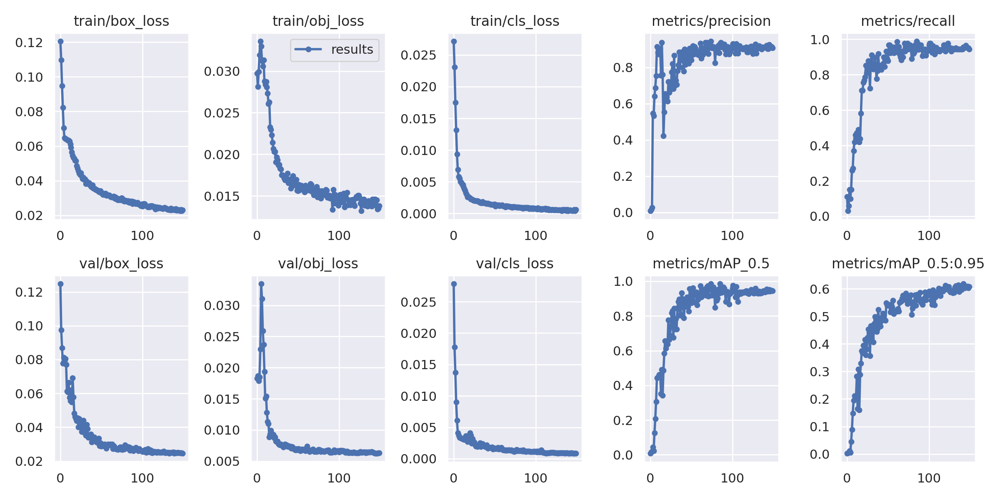

In [ ]:
display.Image(f"runs_palm/yolov5nano/results.png")

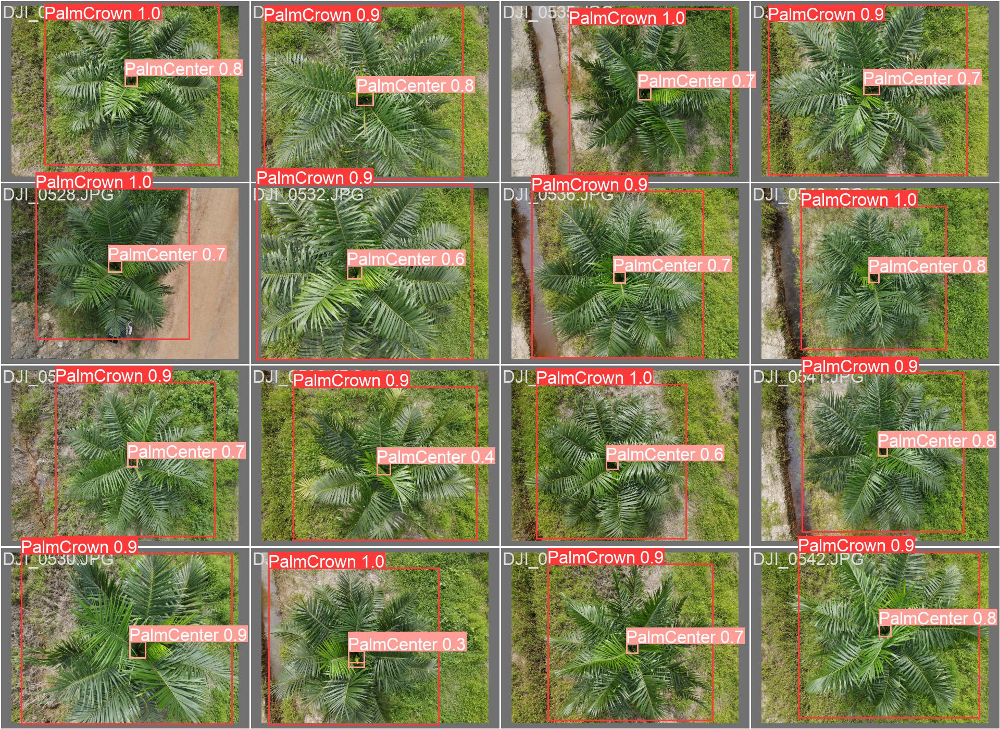

In [ ]:
# Show ver nano predictions
display.Image(f"runs_palm/yolov5nano/val_batch0_pred.jpg")

## Inference

We run `detect.py` to generate palm crown detections from our trained model. 

**Input Arguments**
- weights: The path to our trained model. It is usually located in `/<project name>/<folder name>/weights/<weightname>.pt`
- conf: The confidence threshold. We use this to filter out predictions that have a probability below the confidence threshold. 
- source: The folder or file containing the images or videos that we want to run detections on. 
- project: The name of the main project folder
- name: The name of the folder to save the detected files
- save-txt (optional argument) Save the coordinates of the detected objects as a text file
- save-conf (optional argument) Save the confidence probabilites of the detected objects as a text file


In [ ]:
!python detect.py --weights 'runs_palm/yolov5small/weights/best.pt'  --conf 0.6 --source '../datasets/palmcrowndetection/images/test' --project 'runs_palm' --name 'detected_images' --augment --line=3 --save-txt --save-conf


detect: weights=['runs_palm/yolov5small/weights/best.pt'], source=../datasets/palmcrowndetection/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=False, update=False, project=runs_palm, name=detected_images, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 206 layers, 12312052 parameters, 0 gradients, 16.1 GFLOPs
image 1/106 /content/datasets/palmcrowndetection/images/test/DJI_0551.JPG: 512x640 1 PalmCrown, 1 PalmCenter, 51.7ms
image 2/106 /content/datasets/palmcrowndetection/images/test/DJI_0552.JPG: 512x640 1 PalmCrown, 1 PalmCenter, 37.0ms
image 3/106 /content/datasets/palmcrowndetection/images/test/DJI_0553.JPG: 

#### View Inference Results

In [ ]:
import os

detect_path = r'runs_palm/detected_images'

images = []
for image in os.listdir(detect_path):
    if image != 'labels':
      images.append(mpimg.imread(detect_path + '/' + image))


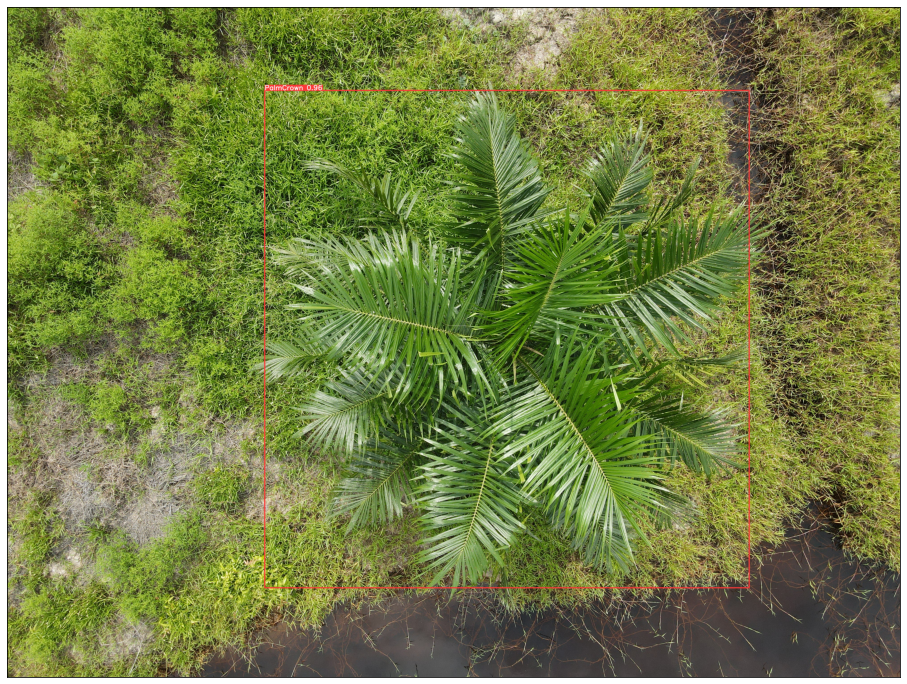

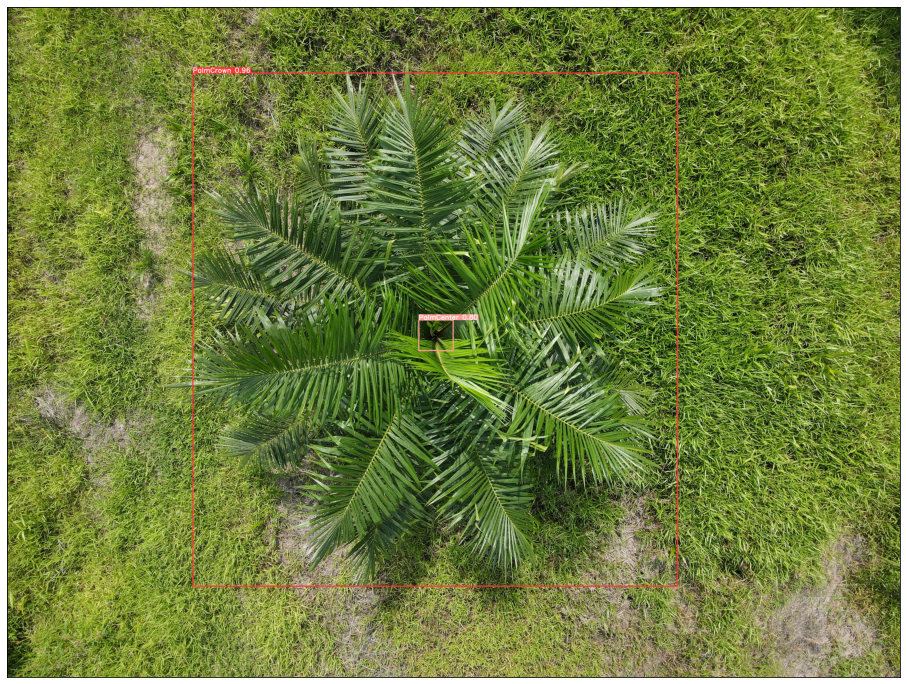

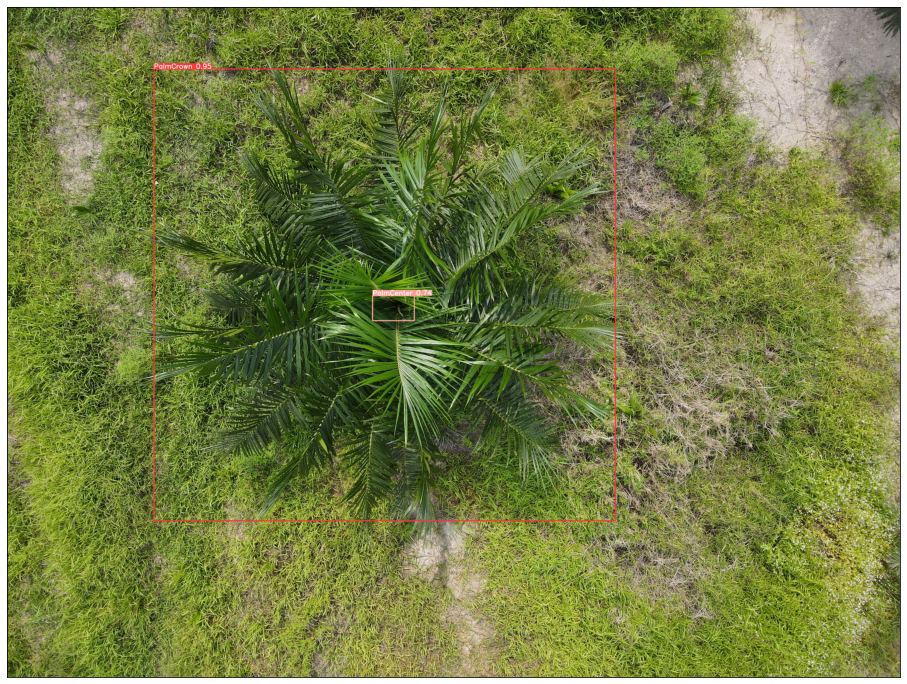

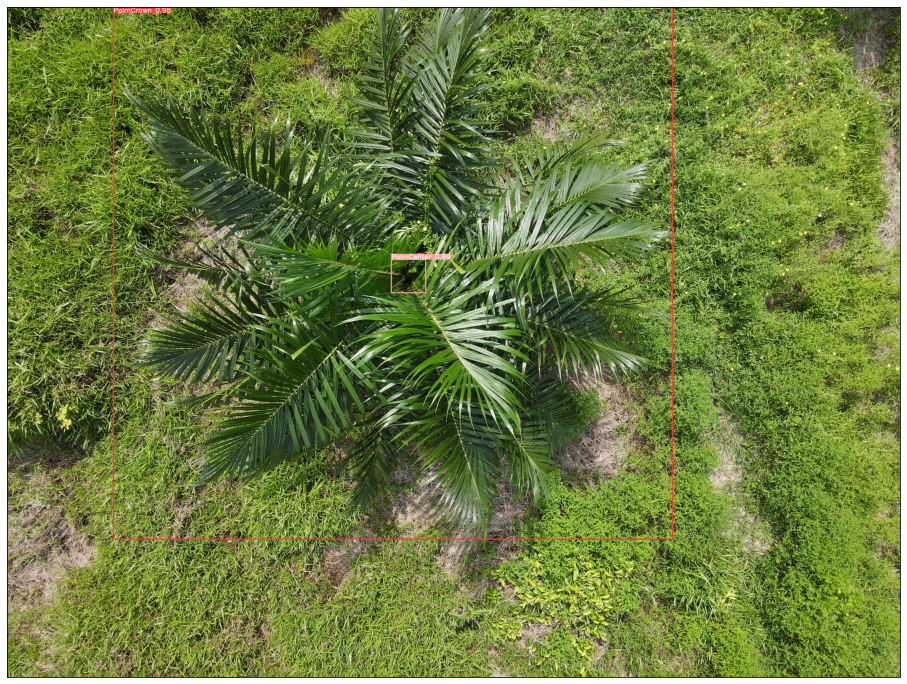

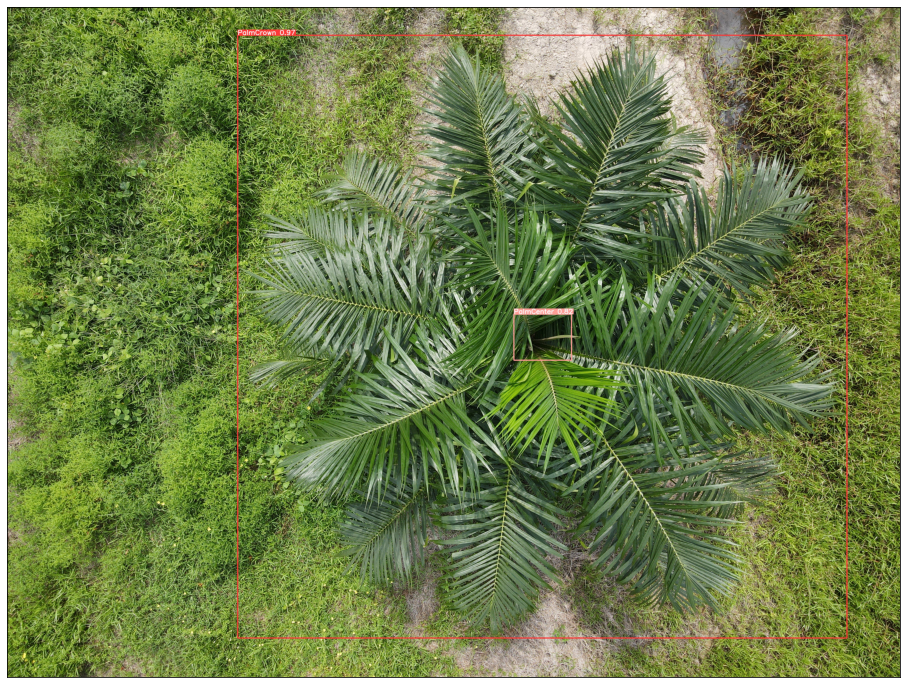

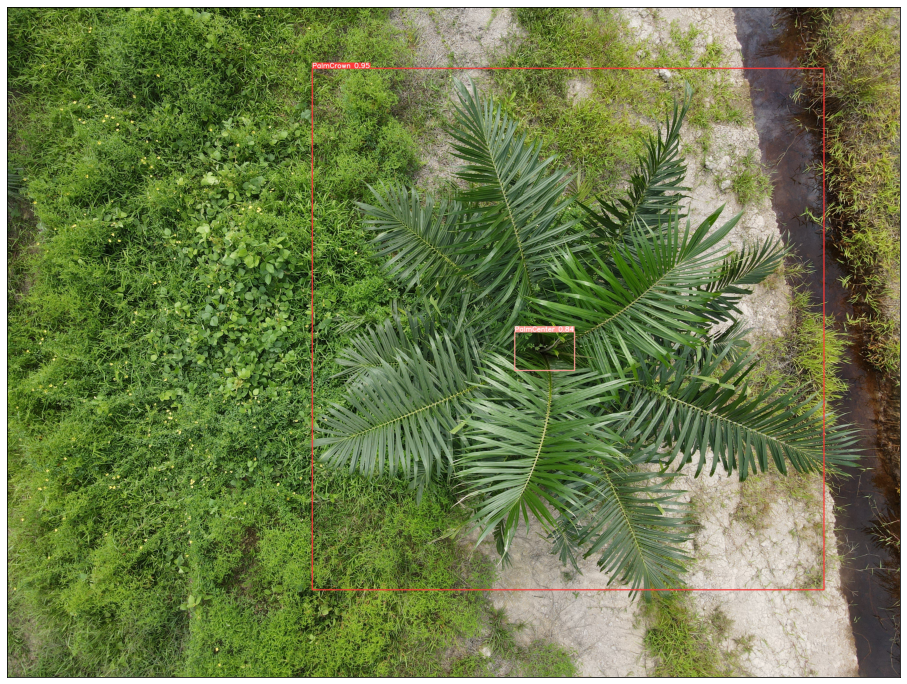

In [ ]:
image_selection = images[10:16]

for image in image_selection:
  plt.figure(figsize=(16,16))
  plt.tick_params(left = False, right = False , labelleft = False, labelbottom = False, bottom = False)
  plt.imshow(image)

In [ ]:
# Remove folders and content for re-runs
#!rm -r runs_palm

#### Inference for Video


Inference for Resized Video (720p)

Inference runtime: 5 minutes 21 seconds

In [ ]:
#Limit output cell height
from google.colab.output import eval_js
eval_js('google.colab.output.setIframeHeight("100")')

# Inference for Video
!python detect.py --weights 'runs_palm/yolov5small/weights/best.pt'  --conf 0.6 --source '../datasets/palmcrowndetection/videos/resized_video_code/drone_video_720p.mp4' --project 'runs_palm' --name 'detect_video' --augment --line=4


detect: weights=['runs_palm/yolov5small/weights/best.pt'], source=../datasets/palmcrowndetection/videos/resized_video_code/drone_video_720p.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=False, update=False, project=runs_palm, name=detect_video, exist_ok=False, line_thickness=4, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 206 layers, 12312052 parameters, 0 gradients, 16.1 GFLOPs
video 1/1 (1/4823) /content/datasets/palmcrowndetection/videos/resized_video_code/drone_video_720p.mp4: 384x640 1 PalmCrown, 1 PalmCenter, 44.7ms
video 1/1 (2/4823) /content/datasets/palmcrowndetection/videos/resized_video_code/drone_video_720p.mp4: 384x640 1 PalmCrown, 1 Pa



#### Custom Inference for Image

In [ ]:
import cv2
import math
import numpy as np
import torch
import torchvision


class Detect():
    def __init__(self, yolo_folder ,model_weight_path, img_size) -> None:
        self.model = torch.hub.load(yolo_folder,'custom', path=model_weight_path,force_reload=True,skip_validation=True,source='local')
        self.stride = self.model.stride
        self.is_model_exist = self.model.pt
        self.names = self.model.names
        self.img_size = self.check_img_size(img_size, s=self.stride)
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        
        print("img_size: ", self.img_size)
        print("Device : ", self.device)
        
    def predict(self, im, confi_thres=0.25, max_detect = 1000):
        # Convert to Grayscale
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        
        original_img_shape = list(im.shape)
        im = self.letterbox(im, new_shape=self.img_size, stride=self.stride, auto=self.is_model_exist)[0]
        # Convert
        im = im.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        im = np.ascontiguousarray(im)
        im = torch.from_numpy(im).to(self.device)
        im = im.float() # uint8 to fp16/32
        im /= 255 
        if len(im.shape) == 3: # If a single image, do this
            im = im[None]

        # print(original_img_shape, im.shape[2:])
        with torch.no_grad():
            predictions = self.model(im)
            predictions = self.non_max_suppression(predictions, confi_thres, max_det=max_detect) # Remove overlapping boxes and points higher than confidence threshold
            predictions[0][:,:4] = self.scale_coords(im.shape[2:], predictions[0][:, :4], original_img_shape).round()
            pred = predictions[0].cpu().numpy()
            del predictions
        return pred
    
    
    
    
    ################################################
    #               HELPER FUNCTIONS               #
    ################################################
    def make_divisible(self,x, divisor):
        # Returns nearest x divisible by divisor
        if isinstance(divisor, torch.Tensor):
            divisor = int(divisor.max())  # to int
        return math.ceil(x / divisor) * divisor


    def check_img_size(self, img_size, s=32, floor=0):
        # Verify image size is a multiple of stride s in each dimension
        if isinstance(img_size, int):  # integer i.e. img_size=640
            new_size = max(self.make_divisible(img_size, int(s)), floor)
        else:  # list i.e. img_size=[640, 480]
            img_size = list(img_size)  # convert to list if tuple
            new_size = [max(self.make_divisible(x, int(s)), floor) for x in img_size]
        return new_size
    
    def letterbox(self, im, new_shape=(640, 640), color=(114, 114, 114), auto=True, scaleFill=False, scaleup=True, stride=32):
        # Resize and pad image while meeting stride-multiple constraints
        shape = im.shape[:2]  # current shape [height, width]
        if isinstance(new_shape, int):
            new_shape = (new_shape, new_shape)

        # Scale ratio (new / old)
        r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
        if not scaleup:  # only scale down, do not scale up (for better val mAP)
            r = min(r, 1.0)

        # Compute padding
        ratio = r, r  # width, height ratios
        new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
        dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
        if auto:  # minimum rectangle
            dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
        elif scaleFill:  # stretch
            dw, dh = 0.0, 0.0
            new_unpad = (new_shape[1], new_shape[0])
            ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

        dw /= 2  # divide padding into 2 sides
        dh /= 2

        if shape[::-1] != new_unpad:  # resize
            im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)
        top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
        left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
        im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
        return im, ratio, (dw, dh)
    
    def non_max_suppression(self, prediction,
                        conf_thres=0.25,
                        iou_thres=0.45,
                        classes=None,
                        agnostic=False,
                        multi_label=False,
                        labels=(),
                        max_det=300):
        """Non-Maximum Suppression (NMS) on inference results to reject overlapping bounding boxes

        Returns:
            list of detections, on (n,6) tensor per image [xyxy, conf, cls]
        """

        bs = prediction.shape[0]  # batch size
        nc = prediction.shape[2] - 5  # number of classes
        xc = prediction[..., 4] > conf_thres  # candidates

        # Checks
        assert 0 <= conf_thres <= 1, f'Invalid Confidence threshold {conf_thres}, valid values are between 0.0 and 1.0'
        assert 0 <= iou_thres <= 1, f'Invalid IoU {iou_thres}, valid values are between 0.0 and 1.0'

        # Settings
        # min_wh = 2  # (pixels) minimum box width and height
        max_wh = 7680  # (pixels) maximum box width and height
        max_nms = 30000  # maximum number of boxes into torchvision.ops.nms()
        time_limit = 0.030 * bs  # seconds to quit after
        redundant = True  # require redundant detections
        multi_label &= nc > 1  # multiple labels per box (adds 0.5ms/img)
        merge = False  # use merge-NMS

        output = [torch.zeros((0, 6), device=self.device)] * bs
        for xi, x in enumerate(prediction):  # image index, image inference
            # Apply constraints
            # x[((x[..., 2:4] < min_wh) | (x[..., 2:4] > max_wh)).any(1), 4] = 0  # width-height
            x = x[xc[xi]]  # confidence

            # Cat apriori labels if autolabelling
            if labels and len(labels[xi]):
                lb = labels[xi]
                v = torch.zeros((len(lb), nc + 5), device=x.device)
                v[:, :4] = lb[:, 1:5]  # box
                v[:, 4] = 1.0  # conf
                v[range(len(lb)), lb[:, 0].long() + 5] = 1.0  # cls
                x = torch.cat((x, v), 0)

            # If none remain process next image
            if not x.shape[0]:
                continue

            # Compute conf
            x[:, 5:] *= x[:, 4:5]  # conf = obj_conf * cls_conf

            # Box (center x, center y, width, height) to (x1, y1, x2, y2)
            box = self.xywh2xyxy(x[:, :4])
            #box = (x[:,:4])
            

            # Detections matrix nx6 (xyxy, conf, cls)
            if multi_label:
                i, j = (x[:, 5:] > conf_thres).nonzero(as_tuple=False).T
                x = torch.cat((box[i], x[i, j + 5, None], j[:, None].float()), 1)
            else:  # best class only
                conf, j = x[:, 5:].max(1, keepdim=True)
                x = torch.cat((box, conf, j.float()), 1)[conf.view(-1) > conf_thres]

            # Filter by class
            if classes is not None:
                x = x[(x[:, 5:6] == torch.tensor(classes, device=x.device)).any(1)]

            # Check shape
            n = x.shape[0]  # number of boxes
            if not n:  # no boxes
                continue
            elif n > max_nms:  # excess boxes
                x = x[x[:, 4].argsort(descending=True)[:max_nms]]  # sort by confidence

            # Batched NMS
            c = x[:, 5:6] * (0 if agnostic else max_wh)  # classes
            boxes, scores = x[:, :4] + c, x[:, 4]  # boxes (offset by class), scores
            i = torchvision.ops.nms(boxes, scores, iou_thres)  # NMS
            if i.shape[0] > max_det:  # limit detections
                i = i[:max_det]
            if merge and (1 < n < 3E3):  # Merge NMS (boxes merged using weighted mean)
                # update boxes as boxes(i,4) = weights(i,n) * boxes(n,4)
                iou = self.box_iou(boxes[i], boxes) > iou_thres  # iou matrix
                weights = iou * scores[None]  # box weights
                x[i, :4] = torch.mm(weights, x[:, :4]).float() / weights.sum(1, keepdim=True)  # merged boxes
                if redundant:
                    i = i[iou.sum(1) > 1]  # require redundancy

            output[xi] = x[i]

        return output
    
    def box_iou(self, box1, box2):
        # https://github.com/pytorch/vision/blob/master/torchvision/ops/boxes.py
        """
        Return intersection-over-union (Jaccard index) of boxes.
        Both sets of boxes are expected to be in (x1, y1, x2, y2) format.
        Arguments:
            box1 (Tensor[N, 4])
            box2 (Tensor[M, 4])
        Returns:
            iou (Tensor[N, M]): the NxM matrix containing the pairwise
                IoU values for every element in boxes1 and boxes2
        """
        def box_area(box):
            # box = 4xn
            return (box[2] - box[0]) * (box[3] - box[1])

        area1 = box_area(box1.T)
        area2 = box_area(box2.T)

        # inter(N,M) = (rb(N,M,2) - lt(N,M,2)).clamp(0).prod(2)
        inter = (torch.min(box1[:, None, 2:], box2[:, 2:]) - torch.max(box1[:, None, :2], box2[:, :2])).clamp(0).prod(2)
        return inter / (area1[:, None] + area2 - inter)  # iou = inter / (area1 + area2 - inter)
    
    def xywh2xyxy(self,x):
        # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
        y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
        y[:, 0] = x[:, 0] - x[:, 2] / 2  # top left x
        y[:, 1] = x[:, 1] - x[:, 3] / 2  # top left y
        y[:, 2] = x[:, 0] + x[:, 2] / 2  # bottom right x
        y[:, 3] = x[:, 1] + x[:, 3] / 2  # bottom right y
        return y
    
    def scale_coords(self, img1_shape, coords, img0_shape, ratio_pad=None):
        # Rescale coords (xyxy) from img1_shape to img0_shape
        if ratio_pad is None:  # calculate from img0_shape
            gain = min(img1_shape[0] / img0_shape[0], img1_shape[1] / img0_shape[1])  # gain  = old / new
            pad = (img1_shape[1] - img0_shape[1] * gain) / 2, (img1_shape[0] - img0_shape[0] * gain) / 2  # wh padding
        else:
            gain = ratio_pad[0][0]
            pad = ratio_pad[1]

        coords[:, [0, 2]] -= pad[0]  # x padding
        coords[:, [1, 3]] -= pad[1]  # y padding
        coords[:, :4] /= gain
        self.clip_coords(coords, img0_shape)
        return coords
    
    def clip_coords(self, boxes, shape):
        # Clip bounding xyxy bounding boxes to image shape (height, width)
        if isinstance(boxes, torch.Tensor):  # faster individually
            boxes[:, 0].clamp_(0, shape[1])  # x1
            boxes[:, 1].clamp_(0, shape[0])  # y1
            boxes[:, 2].clamp_(0, shape[1])  # x2
            boxes[:, 3].clamp_(0, shape[0])  # y2
        else:  # np.array (faster grouped)
            boxes[:, [0, 2]] = boxes[:, [0, 2]].clip(0, shape[1])  # x1, x2
            boxes[:, [1, 3]] = boxes[:, [1, 3]].clip(0, shape[0])  # y1, y2

In [ ]:
import os
custom_detector = Detect(os.getcwd(), 'runs_palm/yolov5small/weights/best.pt',640 )

INFO:yolov5:YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

INFO:yolov5:Fusing layers... 
Fusing layers... 
INFO:yolov5:Model summary: 206 layers, 12312052 parameters, 0 gradients, 16.1 GFLOPs
Model summary: 206 layers, 12312052 parameters, 0 gradients, 16.1 GFLOPs
INFO:yolov5:Adding AutoShape... 
Adding AutoShape... 


img_size:  640
Device :  cuda


In [ ]:
test_image = cv2.imread('../datasets/palmcrowndetection/images/test/DJI_0551.JPG')
custom_detector.predict(test_image)

array([[        591,         576,        2833,        2881,     0.94885,           0],
       [       1700,        1605,        1868,        1752,     0.78913,           1]], dtype=float32)

## Export to Model to other formats

The new file formats are saved under the same ‘weights’ folder as the PyTorch model.

In [ ]:
# TensorRT 
# https://docs.nvidia.com/deeplearning/tensorrt/install-guide/index.html#installing-pip
!pip install -U nvidia-tensorrt --index-url https://pypi.ngc.nvidia.com  # install
clear_output()

tensorRT models are optimized for GPU, while ONNX models are optimized for CPU. 

In [ ]:
!python export.py --weights 'runs_palm/yolov5small/weights/best.pt' --dynamic --include engine onnx --data 'data/palm_data.yaml'  --imgsz 640 640


export: data=data/palm_data.yaml, weights=['runs_palm/yolov5small/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=True, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['engine', 'onnx']
YOLOv5 🚀 v6.2-211-g32a9218 Python-3.7.15 torch-1.12.1+cu113 CPU

Fusing layers... 
Model summary: 206 layers, 12312052 parameters, 0 gradients, 16.1 GFLOPs

PyTorch: starting from runs_palm/yolov5small/weights/best.pt with output shape (1, 25500, 7) (23.9 MB)
TensorRT: export failure ❌ 0.0s: export running on CPU but must be on GPU, i.e. `python export.py --device 0`
requirements: YOLOv5 requirement "onnx" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

requirements: 1 package updated per ['onnx']
requirements: ⚠️ Re